**Importación de librerías**

In [1]:
import os
import numpy as np
import pandas as pd
import cv2
import random
import tensorflow as tf
import matplotlib.pyplot as plt


from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Dense, Flatten, Dropout
from tensorflow.keras.regularizers import l2
from keras.callbacks import TensorBoard

from sklearn.model_selection import train_test_split



**Dataset**

**Variables globales**

In [2]:
img_size = (50,50)
input_shape = (50,50,3)

**Generación de los datos**

Funciones para preprocesar las imágenes

In [3]:
def load_images(path, img_size):
    images = []
    labels = []
    for folder in os.listdir(path):
        if folder.isdigit():
            for patient_folder in os.listdir(os.path.join(path, folder)):
                for file in os.listdir(os.path.join(path, folder, patient_folder)):
                    label = int(file.split(".")[0][-1])
                    img_path = os.path.join(path, folder, patient_folder, file)
                    img = cv2.imread(img_path)
                    if img is None:
                        print(f"Error al leer la imagen: {img_path}")
                        continue
                    img = cv2.resize(img, img_size)
                    images.append(img)
                    labels.append(label)
    return np.array(images), np.array(labels)

def preprocess_images(images):
    images = images.astype("float32") / 255.0
    return images


Carga y preprocesamiento de los datos

In [4]:
path = "C:/Users/sergi/Anaconda_Projects/Deep_Learning/Despliege Modelos/api3/dataset_cancer"

X, y = load_images(path, img_size)
X = preprocess_images(X)

0
10253_idx5_x1001_y1001_class0.png
0
0
10253_idx5_x1001_y1051_class0.png
0
0
10253_idx5_x1001_y1101_class0.png
0
0
10253_idx5_x1001_y1151_class0.png
0
0
10253_idx5_x1001_y1201_class0.png
0
0
10253_idx5_x1001_y1251_class0.png
0
0
10253_idx5_x1001_y1301_class0.png
0
0
10253_idx5_x1001_y1351_class0.png
0
0
10253_idx5_x1001_y1501_class0.png
0
0
10253_idx5_x1001_y1551_class0.png
0
0
10253_idx5_x1001_y1701_class0.png
0
0
10253_idx5_x1001_y351_class0.png
0
0
10253_idx5_x1001_y401_class0.png
0
0
10253_idx5_x1001_y451_class0.png
0
0
10253_idx5_x1001_y501_class0.png
0
0
10253_idx5_x1001_y551_class0.png
0
0
10253_idx5_x1001_y601_class0.png
0
0
10253_idx5_x1001_y651_class0.png
0
0
10253_idx5_x1001_y701_class0.png
0
0
10253_idx5_x1001_y751_class0.png
0
0
10253_idx5_x1001_y801_class0.png
0
0
10253_idx5_x1001_y951_class0.png
0
0
10253_idx5_x1051_y1001_class0.png
0
0
10253_idx5_x1051_y1051_class0.png
0
0
10253_idx5_x1051_y1101_class0.png
0
0
10253_idx5_x1051_y1151_class0.png
0
0
10253_idx5_x1051_y120

**División de los datos**

In [5]:
# División de los datos de entrenamiento y test
X_train, X_test, y_train, y_test = train_test_split(X,
                                                    y,
                                                    test_size=0.2,
                                                    random_state=1983)


In [6]:
# Visualizamos los tamaños de los datos
for data, size in zip(["X_train", "X_test","y_train", "y_test"],[X_train, X_test, y_train, y_test]):
  print(f"Las dimensiones de {data} es: {size.shape}")

Las dimensiones de X_train es: (222019, 50, 50, 3)
Las dimensiones de X_test es: (55505, 50, 50, 3)
Las dimensiones de y_train es: (222019,)
Las dimensiones de y_test es: (55505,)


**Modelo**

Capas

In [11]:

layers = [
    Conv2D(64,
            5,
            activation="relu",
            padding="same",
            input_shape=input_shape),
    MaxPooling2D(2, 2),
    Conv2D(128, 
           3,
            activation="relu", 
            padding="same"),
    MaxPooling2D(2, 2),
    Flatten(),
    Dense(128, activation="relu"),
    Dropout(0.5),
    Dense(1, activation="sigmoid")
]

Creación del modelo

In [12]:
model = Sequential(layers,
                   name="Modelo_binario_Cancer")

Compilación del modelo

In [14]:
model.compile(
    optimizer = "adam",
    loss = "binary_crossentropy",
    metrics = ["accuracy"]
)

Entrenamiento

In [15]:
tensorboard_callbacks = TensorBoard(log_dir="logs")

history = model.fit(X_train,
                    y_train,
                    batch_size=200,
                    epochs = 10,
                    validation_split=0.05,
                    callbacks = [tensorboard_callbacks])

Epoch 1/10
1055/1055 [==============================] - 658s 623ms/step - loss: 0.4181 - accuracy: 0.8172 - val_loss: 0.3712 - val_accuracy: 0.8354
Epoch 2/10
1055/1055 [==============================] - 664s 629ms/step - loss: 0.3758 - accuracy: 0.8408 - val_loss: 0.3532 - val_accuracy: 0.8483
Epoch 3/10
1055/1055 [==============================] - 643s 609ms/step - loss: 0.3602 - accuracy: 0.8478 - val_loss: 0.3359 - val_accuracy: 0.8561
Epoch 4/10
1055/1055 [==============================] - 632s 599ms/step - loss: 0.3470 - accuracy: 0.8539 - val_loss: 0.3684 - val_accuracy: 0.8423
Epoch 5/10
1055/1055 [==============================] - 633s 600ms/step - loss: 0.3404 - accuracy: 0.8573 - val_loss: 0.3237 - val_accuracy: 0.8593
Epoch 6/10
1055/1055 [==============================] - 629s 596ms/step - loss: 0.3352 - accuracy: 0.8600 - val_loss: 0.3451 - val_accuracy: 0.8598
Epoch 7/10
1055/1055 [==============================] - 628s 595ms/step - loss: 0.3309 - accuracy: 0.8620 - val_

TensorBoard

**Evaluación del modelo**

In [16]:
loss_metric, acc_metric = model.evaluate(X_test, y_test)
print("Resultado de la función de pérdida: ", loss_metric)
print("Resultado de acierto: ", acc_metric)

1735/1735 [==============================] - 37s 21ms/step - loss: 0.3173 - accuracy: 0.8636
Resultado de la función de pérdida:  0.31727170944213867
Resultado de acierto:  0.8635798692703247


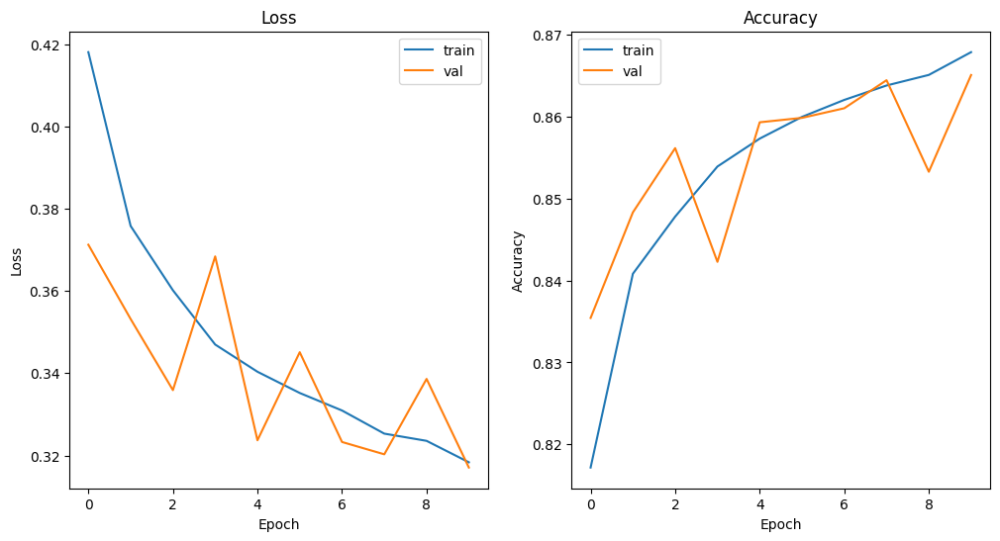

In [17]:

# Obtener las métricas de pérdida y precisión del objeto history
train_loss = history.history['loss']
val_loss = history.history['val_loss']
train_acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

# Crear un gráfico de dos subplots para mostrar la evolución de las métricas
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))

# Subplot 1: pérdida
ax1.plot(train_loss, label='train')
ax1.plot(val_loss, label='val')
ax1.set_title('Loss')
ax1.set_xlabel('Epoch')
ax1.set_ylabel('Loss')
ax1.legend()

# Subplot 2: precisión
ax2.plot(train_acc, label='train')
ax2.plot(val_acc, label='val')
ax2.set_title('Accuracy')
ax2.set_xlabel('Epoch')
ax2.set_ylabel('Accuracy')
ax2.legend()

plt.show()




**Guardar modelo**

In [18]:
model.save("modelo_cancer.h5")